<a href="https://colab.research.google.com/github/Vybavnag/Food_Vision_Project/blob/main/Project_Food_Vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Project: Food Vision

Check if you are using GPU

Best to use GPU to run this for faster results (mixed precision (https://www.tensorflow.org/guide/mixed_precision) used need GPU with compute capability of 7.0 or over) https://developer.nvidia.com/cuda-gpus#compute.

Google colab offers Tesla T4 which is 7.5

In [ ]:
!nvidia-smi -L

GPU 0: NVIDIA A100-SXM4-40GB (UUID: GPU-757cf1f2-5b26-efc5-c412-3cbe92fecc90)


##Importing helper functions

In [ ]:
#Downloading helper functions
!wget https://raw.githubusercontent.com/Vybavnag/Food_Vision_Project/main/helper_functions.py

--2023-09-18 06:42:39--  https://raw.githubusercontent.com/Vybavnag/Food_Vision_Project/main/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 9989 (9.8K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]   9.75K  --.-KB/s    in 0s      

2023-09-18 06:42:39 (83.0 MB/s) - ‘helper_functions.py’ saved [9989/9989]



In [ ]:
#Importing functions for the notebook
from helper_functions import create_tensorboard_callback, plot_loss_curves, compare_histories

##Downloading Data

Using TensorFlowDatasets: https://www.tensorflow.org/datasets/overview

In [ ]:
import tensorflow_datasets as tfds

In [ ]:
!mkdir data

In [ ]:
#Load in the data from the datasets
data_dir = "/content/data"
(train_data, test_data), ds_info = tfds.load(name="food101",
                                             split=["train", "validation"],
                                             shuffle_files=True, #shuffles the data
                                             as_supervised=True, # data gets returned in tuple format
                                             with_info=True, #metadata is also downloaded
                                             data_dir=data_dir)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

IOPub message rate exceed

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /content/data/food101/2.0.0.incomplete0Q2SL6/food101-train.tfrecord*...:   0%|          | 0/75750 [0…

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /content/data/food101/2.0.0.incomplete0Q2SL6/food101-validation.tfrecord*...:   0%|          | 0/252…

Dataset food101 downloaded and prepared to /content/data/food101/2.0.0. Subsequent calls will reuse this data.


##Visualzing and exploring the data

In [ ]:
#Featuers of Food101
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [ ]:
#Getting the class names
class_names= ds_info.features["label"].names

In [ ]:
#Looking at one sample
train_one_sample = train_data.take(1)
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [ ]:
# Output info about our training sample
for image, label in train_one_sample:
  print(f"""
  Image shape: {image.shape}
  Image datatype: {image.dtype}
  Target class from Food101 (tensor form): {label}
  Class name (str form): {class_names[label.numpy()]}
  """)



  Image shape: (512, 384, 3)
  Image datatype: <dtype: 'uint8'>
  Target class from Food101 (tensor form): 19
  Class name (str form): chicken_quesadilla
  


In [ ]:
import tensorflow as tf
tf.reduce_min(image), tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

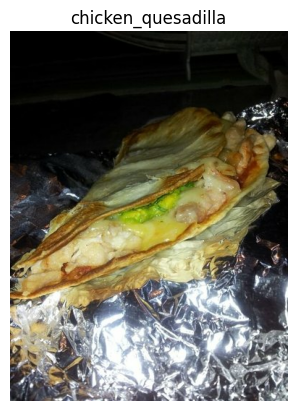

In [ ]:
#Printing out image
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()])
plt.axis(False);

##Preprocessing the data

In [ ]:
num_classes = ds_info.features['label'].num_classes

In [ ]:
#Making a function to preproces it
def preprocess_img(image, label, img_shape=224):
  image=tf.image.resize(image,[img_shape,img_shape])
  return tf.cast(image, tf.float32), tf.one_hot(label, depth=num_classes) #return (float32_image,label) tuple

In [ ]:
prep = preprocess_img(image,label)
prep

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  7.7907934,   7.7907934,   5.7907934],
         [  5.714286 ,   5.714286 ,   3.7142856],
         [ 10.999987 ,  10.999987 ,   8.999987 ]],
 
        [[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  6.770399 ,   6.770399 ,   4.770399 ],
         [  6.790833 ,   6.790833 ,   4.790833 ],
         [ 10.1887665,  10.1887665,   8.1887665]],
 
        [[  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         [  0.       ,   0.       ,   0.       ],
         ...,
         [  7.4745007,   7.4745007,   5.4745007],
         [  9.887782 ,   9.887782 ,   7.8877826],
         [ 11.505098 ,  11.505098 ,   9.505098

In [ ]:
#Creating Batches for Dataset
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)
train_data = train_data.shuffle(buffer_size = 1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

test_data = test_data.map(preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)

train_data, test_data

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>)

In [ ]:
from helper_functions import create_tensorboard_callback

##Using mixed precision  

https://www.tensorflow.org/guide/mixed_precision

In [ ]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy("mixed_float16")# set global data policy to mixed precision

In [ ]:
mixed_precision.global_policy()

<Policy "mixed_float16">

##Buliding base model (feature extraction)

In [ ]:
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing

# Setup the base model and freeze its layers (this will extract features)
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False)
base_model.trainable = False
# Setup model architecture with trainable top layers
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x = base_model(inputs, training=False) # put the base model in inference mode so weights which need to stay frozen, stay frozen
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(101, activation="softmax", name="output_layer")(x)
model = tf.keras.Model(inputs, outputs)

# Compile the model
model.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])


24274472/24274472 [==============================] - 2s 0us/step


In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, None, None, 1280   5919312   
 nal)                        )                                   
                                                                 
 global_avg_pool_layer (Glo  (None, 1280)              0         
 balAveragePooling2D)                                            
                                                                 
 output_layer (Dense)        (None, 101)               129381    
                                                                 
Total params: 6048693 (23.07 MB)
Trainable params: 129381 (505.39 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [ ]:
initial_epoch = 5
history= model.fit(train_data,
                    epochs=initial_epoch,
                    steps_per_epoch=len(train_data),
                    validation_data=test_data,
                    validation_steps=0.15*len(test_data),
                    callbacks=[create_tensorboard_callback("training_logs", "feature_extraction")])

Saving TensorBoard log files to: training_logs/feature_extraction/20230918-065201
Epoch 1/5
2368/2368 [==============================] - 65s 20ms/step - loss: 1.7447 - accuracy: 0.5774 - val_loss: 1.1513 - val_accuracy: 0.6943
Epoch 2/5
2368/2368 [==============================] - 44s 19ms/step - loss: 1.2122 - accuracy: 0.6870 - val_loss: 1.0331 - val_accuracy: 0.7258
Epoch 3/5
2368/2368 [==============================] - 45s 19ms/step - loss: 1.0642 - accuracy: 0.7220 - val_loss: 0.9920 - val_accuracy: 0.7356
Epoch 4/5
2368/2368 [==============================] - 46s 19ms/step - loss: 0.9683 - accuracy: 0.7465 - val_loss: 0.9796 - val_accuracy: 0.7361
Epoch 5/5
2368/2368 [==============================] - 45s 19ms/step - loss: 0.8976 - accuracy: 0.7622 - val_loss: 0.9705 - val_accuracy: 0.7421


##Creating Evaluaion metrics and evaluating our model

In [ ]:
# Evaluate model on whole test dataset
results_feature_extract_model = model.evaluate(test_data)
results_feature_extract_model

790/790 [==============================] - 12s 15ms/step - loss: 0.9713 - accuracy: 0.7341


[0.9712860584259033, 0.7340593934059143]

In [ ]:
pred_probs=model.predict(test_data,verbose=1)
pred_classes = pred_probs.argmax(axis=1)

pred_probs, pred_classes

790/790 [==============================] - 13s 14ms/step


(array([[0.000e+00, 0.000e+00, 0.000e+00, ..., 0.000e+00, 0.000e+00,
         0.000e+00],
        [0.000e+00, 2.980e-07, 0.000e+00, ..., 0.000e+00, 1.788e-07,
         0.000e+00],
        [2.161e-03, 1.431e-05, 8.565e-05, ..., 1.767e-03, 1.019e-03,
         8.750e-04],
        ...,
        [2.618e-02, 7.570e-06, 9.056e-03, ..., 1.397e-03, 1.482e-02,
         2.849e-04],
        [2.775e-03, 1.907e-06, 8.068e-04, ..., 3.191e-01, 2.840e-03,
         7.782e-04],
        [0.000e+00, 4.768e-07, 0.000e+00, ..., 4.768e-07, 1.848e-06,
         5.960e-08]], dtype=float16),
 array([65, 70, 34, ..., 17, 73, 88]))

In [ ]:
# To get our test labels we need to unravel our test_data BatchDataset
y_labels = []
for images, labels in test_data.unbatch():
  y_labels.append(labels.numpy().argmax()) # currently test labels look like: [0, 0, 0, 1, .... 0, 0], we want the index value where the "1" occurs
y_labels[:10] # look at the first 10

[37, 99, 40, 60, 1, 69, 52, 62, 77, 67]

In [ ]:
from sklearn.metrics import classification_report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)
class_f1_scores = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Add class names and f1-scores to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]
class_f1_scores

{'apple_pie': 0.0,
 'baby_back_ribs': 0.003861003861003861,
 'baklava': 0.007707129094412331,
 'beef_carpaccio': 0.0,
 'beef_tartare': 0.013186813186813187,
 'beet_salad': 0.02298850574712644,
 'beignets': 0.011695906432748539,
 'bibimbap': 0.010869565217391306,
 'bread_pudding': 0.014109347442680777,
 'breakfast_burrito': 0.004282655246252676,
 'bruschetta': 0.003861003861003861,
 'caesar_salad': 0.012096774193548388,
 'cannoli': 0.0,
 'caprese_salad': 0.008474576271186442,
 'carrot_cake': 0.004484304932735427,
 'ceviche': 0.004357298474945533,
 'cheesecake': 0.0039603960396039604,
 'cheese_plate': 0.02290076335877863,
 'chicken_curry': 0.012711864406779662,
 'chicken_quesadilla': 0.0040650406504065045,
 'chicken_wings': 0.01054481546572935,
 'chocolate_cake': 0.004158004158004159,
 'chocolate_mousse': 0.012072434607645876,
 'churros': 0.008213552361396302,
 'clam_chowder': 0.024013722126929673,
 'club_sandwich': 0.007843137254901962,
 'crab_cakes': 0.013628620102214651,
 'creme_brule

In [ ]:
import pandas as pd
f1_scores = pd.DataFrame({"class_names": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores

,class_names,f1-score
76,pizza,0.024341
24,clam_chowder,0.024014
5,beet_salad,0.022989
17,cheese_plate,0.022901
71,paella,0.021090
...,...,...
33,edamame,0.000000
51,guacamole,0.000000
12,cannoli,0.000000
38,fish_and_chips,0.000000


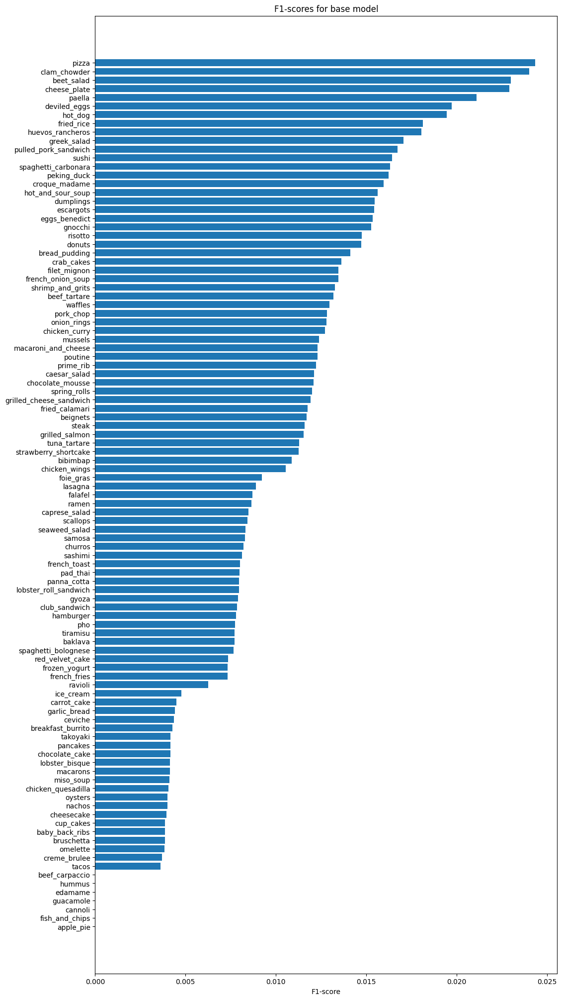

In [ ]:
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values) # get f1-score values
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for base model")
ax.invert_yaxis(); # reverse the order of our plot

In [ ]:
import itertools
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import confusion_matrix

def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(100, 100), text_size=20, norm=False, savefig=True):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Changed (plot x-labels vertically) ###
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names)

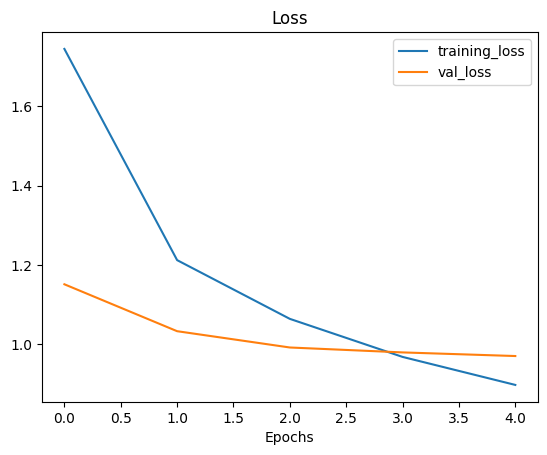

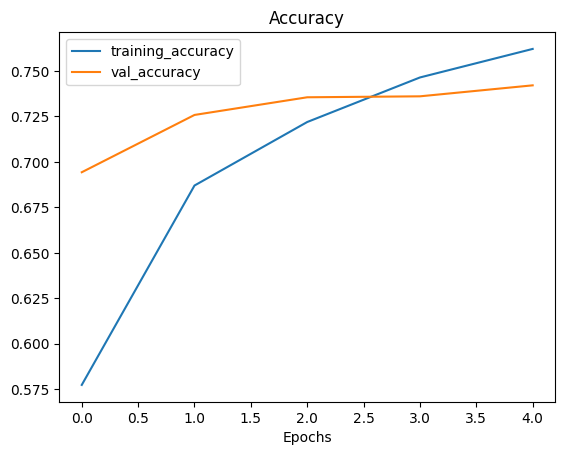

In [ ]:
plot_loss_curves(history)

##Using Data Augmentation

In [ ]:
# Create data augmentation layer to incorporate it right into the model
from tensorflow.keras import layers
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.models import Sequential

# Setup data augmentation
data_augmentation = Sequential([
  preprocessing.RandomFlip("horizontal"),
  preprocessing.RandomRotation(0.2),
  preprocessing.RandomHeight(0.2),
  preprocessing.RandomWidth(0.2),
  preprocessing.RandomZoom(0.2),
], name="data_augmentation")

In [ ]:
train_one_sample = train_data.take(1)
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 101), dtype=tf.float32, name=None))>

In [ ]:
from tensorflow.keras import layers
import tensorflow as tf
from tensorflow.keras.layers.experimental import preprocessing

# Setup the data augmentation model
base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2S(include_top=False)
base_model.trainable = False
inputs = layers.Input(shape=(224, 224, 3), name="input_layer")
x =  data_augmentation(inputs)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D(name="global_avg_pool_layer")(x)
outputs = layers.Dense(101, activation="softmax", name="output_layer")(x)
model_1 = tf.keras.Model(inputs, outputs)

# Compile the model
model_1.compile(loss="categorical_crossentropy",
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

82420632/82420632 [==============================] - 5s 0us/step


In [ ]:
initial_epoch = 5
history_1= model_1.fit(train_data,
                    epochs=initial_epoch,
                    steps_per_epoch=len(train_data),
                    validation_data=test_data,
                    validation_steps=0.15*len(test_data),
                    callbacks=[create_tensorboard_callback("training_logs", "data_augmentation")])

Saving TensorBoard log files to: training_logs/data_augmentation/20230918-065734
Epoch 1/5
2368/2368 [==============================] - 242s 96ms/step - loss: 2.2326 - accuracy: 0.4588 - val_loss: 1.3567 - val_accuracy: 0.6255
Epoch 2/5
2368/2368 [==============================] - 121s 51ms/step - loss: 1.7670 - accuracy: 0.5533 - val_loss: 1.2363 - val_accuracy: 0.6581
Epoch 3/5
2368/2368 [==============================] - 99s 41ms/step - loss: 1.6583 - accuracy: 0.5770 - val_loss: 1.1855 - val_accuracy: 0.6780
Epoch 4/5
2368/2368 [==============================] - 89s 37ms/step - loss: 1.5935 - accuracy: 0.5929 - val_loss: 1.1441 - val_accuracy: 0.6838
Epoch 5/5
2368/2368 [==============================] - 85s 35ms/step - loss: 1.5524 - accuracy: 0.6018 - val_loss: 1.1321 - val_accuracy: 0.6888


##Evaluating the second model

In [ ]:
results_Data_Augmentation_model = model_1.evaluate(test_data)

790/790 [==============================] - 16s 20ms/step - loss: 1.1657 - accuracy: 0.6816


In [ ]:
results_feature_extract_model, results_Data_Augmentation_model

([0.9712860584259033, 0.7340593934059143],
 [1.1657425165176392, 0.6816237568855286])

In [ ]:
pred_probs_1 = model_1.predict(test_data,verbose=1)
pred_classes_1 = pred_probs_1.argmax(axis=1)

pred_probs_1, pred_classes_1

790/790 [==============================] - 18s 19ms/step


(array([[1.788e-07, 5.960e-06, 2.980e-07, ..., 3.576e-07, 2.027e-05,
         5.960e-08],
        [3.122e-03, 5.009e-03, 1.857e-03, ..., 9.298e-06, 5.447e-03,
         1.326e-03],
        [9.501e-05, 1.431e-06, 1.361e-04, ..., 7.453e-04, 7.856e-05,
         9.741e-01],
        ...,
        [6.504e-04, 3.152e-04, 1.416e-04, ..., 4.463e-03, 5.603e-05,
         3.266e-05],
        [1.192e-07, 7.212e-06, 2.086e-06, ..., 1.490e-06, 1.281e-03,
         2.396e-05],
        [8.166e-06, 3.915e-04, 1.192e-06, ..., 5.960e-07, 4.826e-04,
         7.784e-05]], dtype=float16),
 array([ 90,  97, 100, ...,  21,   3,  25]))

In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes_1,
                      classes=class_names)

In [ ]:
classification_report_dict_1 = classification_report(y_labels, pred_classes, output_dict=True)
class_f1_scores_1 = {}
# Loop through classification report dictionary items
for k, v in classification_report_dict_1.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Add class names and f1-scores to new dictionary
    class_f1_scores_1[class_names[int(k)]] = v["f1-score"]
class_f1_scores_1

{'apple_pie': 0.0,
 'baby_back_ribs': 0.003861003861003861,
 'baklava': 0.007707129094412331,
 'beef_carpaccio': 0.0,
 'beef_tartare': 0.013186813186813187,
 'beet_salad': 0.02298850574712644,
 'beignets': 0.011695906432748539,
 'bibimbap': 0.010869565217391306,
 'bread_pudding': 0.014109347442680777,
 'breakfast_burrito': 0.004282655246252676,
 'bruschetta': 0.003861003861003861,
 'caesar_salad': 0.012096774193548388,
 'cannoli': 0.0,
 'caprese_salad': 0.008474576271186442,
 'carrot_cake': 0.004484304932735427,
 'ceviche': 0.004357298474945533,
 'cheesecake': 0.0039603960396039604,
 'cheese_plate': 0.02290076335877863,
 'chicken_curry': 0.012711864406779662,
 'chicken_quesadilla': 0.0040650406504065045,
 'chicken_wings': 0.01054481546572935,
 'chocolate_cake': 0.004158004158004159,
 'chocolate_mousse': 0.012072434607645876,
 'churros': 0.008213552361396302,
 'clam_chowder': 0.024013722126929673,
 'club_sandwich': 0.007843137254901962,
 'crab_cakes': 0.013628620102214651,
 'creme_brule

In [ ]:
f1_scores_1 = pd.DataFrame({"class_names": list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)
f1_scores_1

,class_names,f1-score
76,pizza,0.024341
24,clam_chowder,0.024014
5,beet_salad,0.022989
17,cheese_plate,0.022901
71,paella,0.021090
...,...,...
33,edamame,0.000000
51,guacamole,0.000000
12,cannoli,0.000000
38,fish_and_chips,0.000000


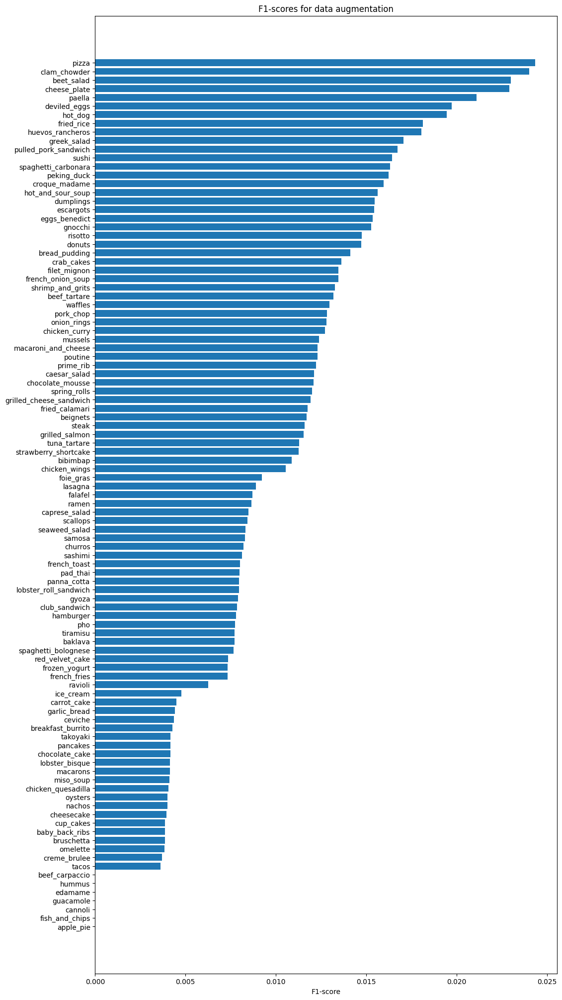

In [ ]:
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores_1)), f1_scores_1["f1-score"].values) # get f1-score values
ax.set_yticks(range(len(f1_scores_1)))
ax.set_yticklabels(f1_scores_1["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for data augmentation")
ax.invert_yaxis(); # reverse the order of our plot

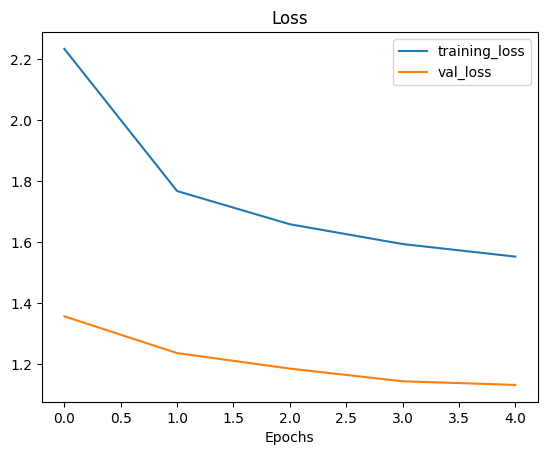

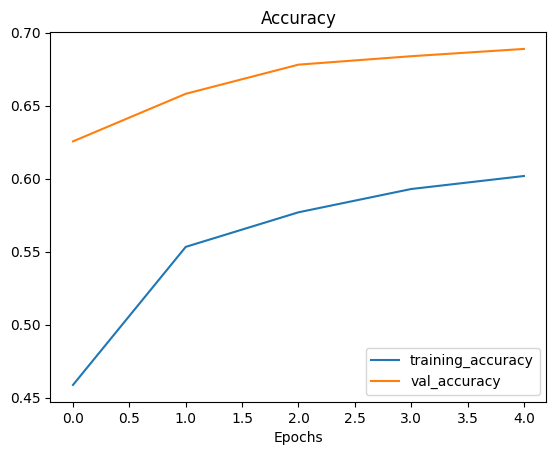

In [ ]:
plot_loss_curves(history_1)

##Fine tuning

In [ ]:
# To begin fine-tuning, let's start by setting the last 10 layers of our base_model.trainable = True
base_model.trainable = True

# Freeze all layers except for the last 30
for layer in base_model.layers[:-30]:
  layer.trainable = False

# Recompile (we have to recompile our models every time we make a change)
model_1.compile(loss="categorical_crossentropy",
                optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001), # when fine-tuning you typically want to lower the learning rate by 10x*
                metrics=["accuracy"])


In [ ]:
#refit the model (except with more trainable layers)
final_epoch = initial_epoch+5
history_2 = model_1.fit(train_data,
                        epochs=final_epoch,
                        validation_data=test_data,
                        validation_steps=0.15*len(test_data),
                        initial_epoch=history_1.epoch[-1], #start training from where model left off
                        callbacks=[create_tensorboard_callback("training_logs", "data_augmentation")])

Saving TensorBoard log files to: transfer_learning/fine_tune/20230918-070925
Epoch 5/10
2368/2368 [==============================] - 115s 40ms/step - loss: 1.3341 - accuracy: 0.6511 - val_loss: 0.9124 - val_accuracy: 0.7461
Epoch 6/10
2368/2368 [==============================] - 90s 38ms/step - loss: 1.1738 - accuracy: 0.6893 - val_loss: 0.8474 - val_accuracy: 0.7608
Epoch 7/10
2368/2368 [==============================] - 88s 37ms/step - loss: 1.0501 - accuracy: 0.7180 - val_loss: 0.8073 - val_accuracy: 0.7697
Epoch 8/10
2368/2368 [==============================] - 87s 36ms/step - loss: 0.9531 - accuracy: 0.7417 - val_loss: 0.7768 - val_accuracy: 0.7757
Epoch 9/10
2368/2368 [==============================] - 85s 35ms/step - loss: 0.8658 - accuracy: 0.7624 - val_loss: 0.8006 - val_accuracy: 0.7823
Epoch 10/10
2368/2368 [==============================] - 83s 35ms/step - loss: 0.7923 - accuracy: 0.7787 - val_loss: 0.7941 - val_accuracy: 0.7776


In [ ]:
results_FineTune = model_1.evaluate(test_data)
results_FineTune


790/790 [==============================] - 16s 20ms/step - loss: 0.8162 - accuracy: 0.7762


[0.8161771893501282, 0.7761980295181274]

In [ ]:
results_feature_extract_model, results_Data_Augmentation_model, results_FineTune

([0.9712860584259033, 0.7340593934059143],
 [1.1657425165176392, 0.6816237568855286],
 [0.8161771893501282, 0.7761980295181274])

In [ ]:
pred_probs_2=model_1.predict(test_data,verbose=1)
pred_classes_2 = pred_probs_2.argmax(axis=1)

790/790 [==============================] - 18s 19ms/step


In [ ]:
make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes_2,
                      classes=class_names)

In [ ]:
classification_report_dict_1 = classification_report(y_labels, pred_classes, output_dict=True)
class_f1_scores_2 = {}
for k, v in classification_report_dict.items():
  if k == "accuracy":
    break
  else:
    class_f1_scores_2[class_names[int(k)]] = v["f1-score"]
class_f1_scores_2

{'apple_pie': 0.0,
 'baby_back_ribs': 0.003861003861003861,
 'baklava': 0.007707129094412331,
 'beef_carpaccio': 0.0,
 'beef_tartare': 0.013186813186813187,
 'beet_salad': 0.02298850574712644,
 'beignets': 0.011695906432748539,
 'bibimbap': 0.010869565217391306,
 'bread_pudding': 0.014109347442680777,
 'breakfast_burrito': 0.004282655246252676,
 'bruschetta': 0.003861003861003861,
 'caesar_salad': 0.012096774193548388,
 'cannoli': 0.0,
 'caprese_salad': 0.008474576271186442,
 'carrot_cake': 0.004484304932735427,
 'ceviche': 0.004357298474945533,
 'cheesecake': 0.0039603960396039604,
 'cheese_plate': 0.02290076335877863,
 'chicken_curry': 0.012711864406779662,
 'chicken_quesadilla': 0.0040650406504065045,
 'chicken_wings': 0.01054481546572935,
 'chocolate_cake': 0.004158004158004159,
 'chocolate_mousse': 0.012072434607645876,
 'churros': 0.008213552361396302,
 'clam_chowder': 0.024013722126929673,
 'club_sandwich': 0.007843137254901962,
 'crab_cakes': 0.013628620102214651,
 'creme_brule

In [ ]:
f1_scores_2 = pd.DataFrame({"class_names": list(class_f1_scores_2.keys()),
                          "f1-score": list(class_f1_scores_2.values())}).sort_values("f1-score", ascending=False)

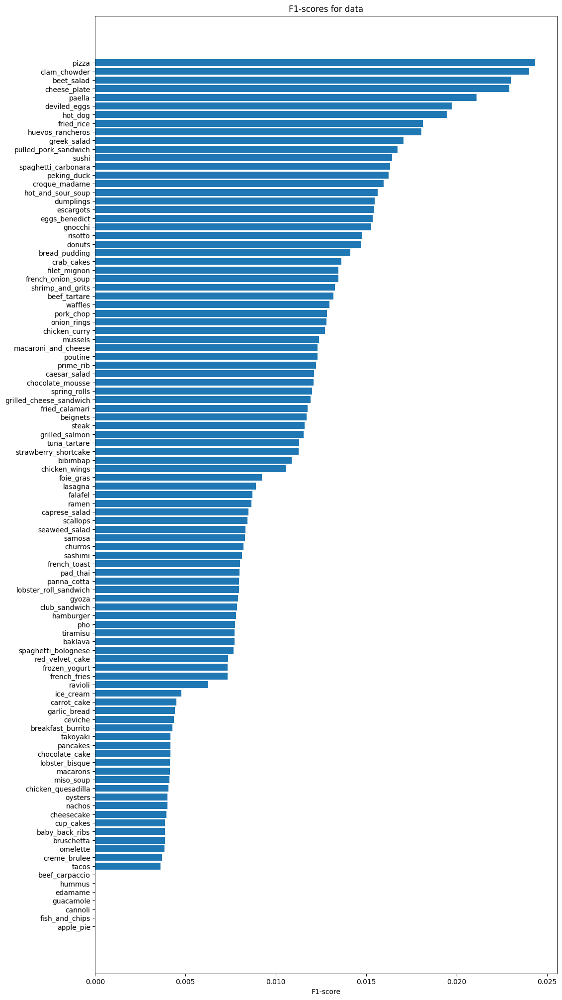

In [ ]:
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores_2)), f1_scores_2["f1-score"].values) # get f1-score values
ax.set_yticks(range(len(f1_scores_2)))
ax.set_yticklabels(f1_scores_2["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for data")
ax.invert_yaxis(); # reverse the order of our plot

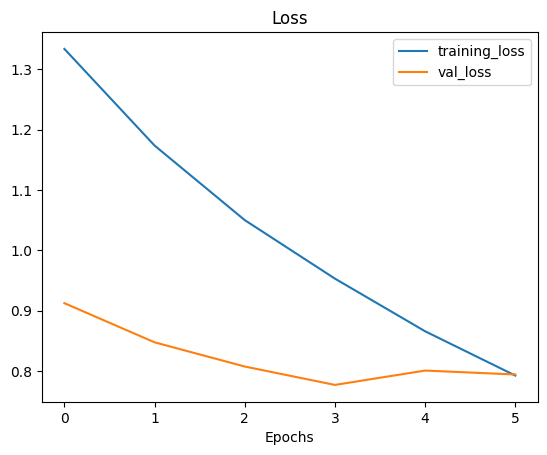

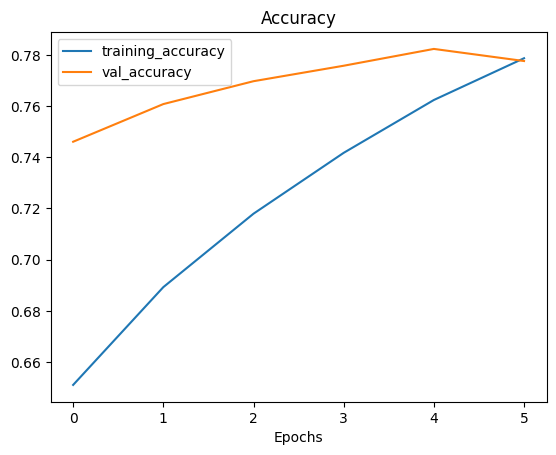

In [ ]:
plot_loss_curves(history_2)


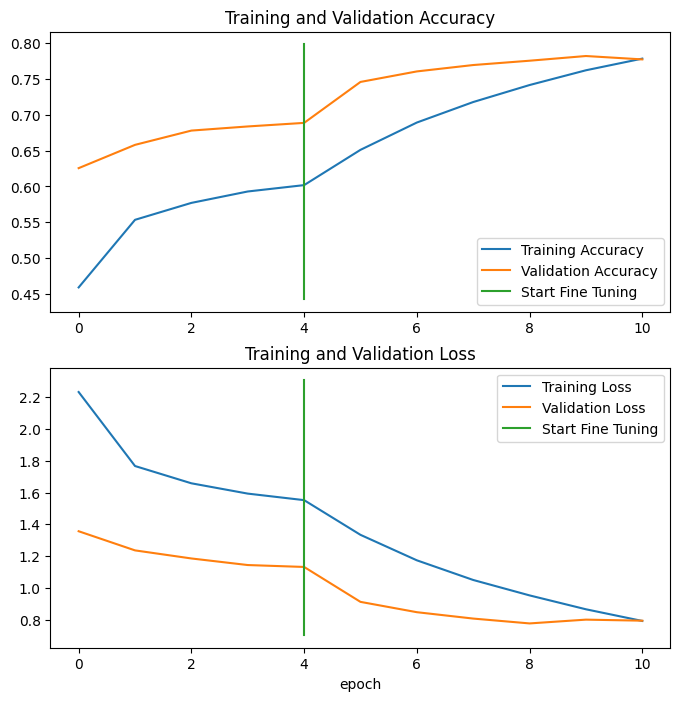

In [ ]:
from helper_functions import compare_histories
compare_histories(original_history=history_1,
                 new_history=history_2,
                 initial_epochs=5)

##Visualizing the predictions

In [ ]:
#Using tensorboard
# Upload TensorBoard dev records
!tensorboard dev upload --logdir ./transfer_learning \
  --name "Transfer Learning Experiments with 10 Food101 Classes" \
  --description "A series of different transfer learning experiments with varying amounts of data and fine-tuning." \
  --one_shot # exits the uploader once its finished uploading

2023-09-18 07:19:51.918194: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT

***** TensorBoard Uploader *****

This will upload your TensorBoard logs to https://tensorboard.dev/ from
the following directory:

./transfer_learning

This TensorBoard will be visible to everyone. Do not upload sensitive
data.

Your use of this service is subject to Google's Terms of Service
<https://policies.google.com/terms> and Privacy Policy
<https://policies.google.com/privacy>, and TensorBoard.dev's Terms of Service
<https://tensorboard.dev/policy/terms/>.

This notice will not be shown again while you are logged into the uploader.
To log out, run `tensorboard dev auth revoke`.

Continue? (yes/NO) yes

To sign in with the TensorBoard uploader:

1. On your computer or phone, visit:

   https://www.google.com/device

2. Sign in with your Google account, then enter:

   FXRG-PWMB



New experiment created. View your TensorBoard at: https://tensorboard.dev/ex

##Creating a function to use custom images to predict

In [ ]:
# Create a function to load and prepare images
def load_and_prep_image(filename, img_shape=224, scale=True):
  """
  Reads in an image from filename, turns it into a tensor and reshapes into
  specified shape (img_shape, img_shape, color_channels=3).

  Args:
    filename (str): path to target image
    image_shape (int): height/width dimension of target image size
    scale (bool): scale pixel values from 0-255 to 0-1 or not

  Returns:
    Image tensor of shape (img_shape, img_shape, 3)
  """
  # Read in the image
  img = tf.io.read_file(filename)

  # Decode image into tensor
  img = tf.io.decode_image(img)

  # Resize the image
  img = tf.image.resize(img, [img_shape, img_shape])

  # Scale? Yes/no
  if scale:
    # rescale the image (get all values between 0 and 1)
    return img/255.
  else:
    return img # don't need to rescale images for EfficientNet models in TensorFlow


In [ ]:
# Adjust function to work with multi-class
def pred_and_plot(model, filename, class_names= class_names):
  """
  Imports an image located at filename, makes a prediction on it with
  a trained model and plots the image with the predicted class as the title.
  """
  # Import the target image and preprocess it
  img = load_and_prep_image(filename)

  # Make a prediction
  pred = model.predict(tf.expand_dims(img, axis=0))

  # Get the predicted class
  if len(pred[0]) > 1: # check for multi-class
    pred_class = class_names[pred.argmax()] # if more than one output, take the max
  else:
    pred_class = class_names[int(tf.round(pred)[0][0])] # if only one output, round

  # Plot the image and predicted class
  plt.imshow(img)
  plt.title(f"Prediction: {pred_class}")
  plt.axis(False);

In [ ]:
#Uploading Custom Image
pred_and_plot(model=model_1,
              filename="/content/bibibap.jpeg",
              class_names=class_names)
